In [ ]:
from __future__ import print_function, division
import os
import os.path, sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import seaborn as sns
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
import torchaudio
import torchaudio.transforms as T
from torchvision.io import read_image
from torchvision import transforms, utils
from torchvision.datasets import ImageFolder
import torchvision.models as models
import librosa
import wave
from IPython.display import Audio
from skimage import io, transform
from PIL import Image, ImageOps
!pip install umap-learn
!pip install umap-learn[plot]
import umap
import umap.plot
from sklearn.datasets import load_digits
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler
from sklearn.cluster import KMeans
from google.colab import drive
drive.mount('/content/drive')

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Functions

In [ ]:
# Plot and save the waveform from the wave file 
def plot_waveform(idx, waveform, sr, title="Waveform"):
    waveform = waveform.numpy()

    num_channels, num_frames = waveform.shape
    time_axis = torch.arange(0, num_frames) / sr

    figure, axes = plt.subplots(num_channels, 1)
    axes.plot(time_axis, waveform[0], linewidth=1)
    axes.grid(True)
    figure.suptitle(title)
    plt.xlabel('Time')
    plt.show(block=False)
    #plt.savefig(r'C:\Users\kzammit\Repos\school\phys555\project-DL\orcas_classification\wavpngs\wav-' + str(idx) + '.png')
    plt.close()

In [ ]:
# Plot and save the spectrogram from the wave file
def create_spectrogram(idx, specgram):

    # set the transform to PIL Image
    transform=transforms.ToPILImage()

    # transform the input spectrogram to a PIL image
    specgram= transform(specgram)

    #so low frequencies are at the bottom  
    specgram = ImageOps.flip(specgram)

    # for dB-scale spectrograms 
    #specgram.save(r"/content/drive/MyDrive/Masters/PHYS555/DL/specs/spec-" + str(idx) + ".png")

    # for mag-scale spectrograms 
    #specgram.save(r"/content/drive/MyDrive/Masters/PHYS555/DL/magspecs/spec-" + str(idx) + ".png")

    # display an example 
    display(specgram)
    

In [ ]:
# Crop the spectrogram figures and save as pngs
def crop(path, dirs):
    for item in dirs:
        fullpath = os.path.join(path,item)
        if os.path.isfile(fullpath):
            im = Image.open(fullpath)
            f, e = os.path.splitext(fullpath)
            # last one does the height
            # left top right bottom
            imCrop = im.crop((80, 58, 475, 425)) #corrected
            #imCrop.save(f + '-crop.png', "PNG", quality=300)
            display(imCrop)

In [ ]:
def preprocess():
    
    transform =  transforms.Compose([
        transforms.ToPILImage(),
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor()])
  
    return transform

# Spectrogram Generation and Preprocessing

In [ ]:
#!unzip -uq "/content/drive/My Drive/Masters/PHYS555/DL/audio.zip" -d "/content/drive/My Drive/Masters/PHYS555/DL"

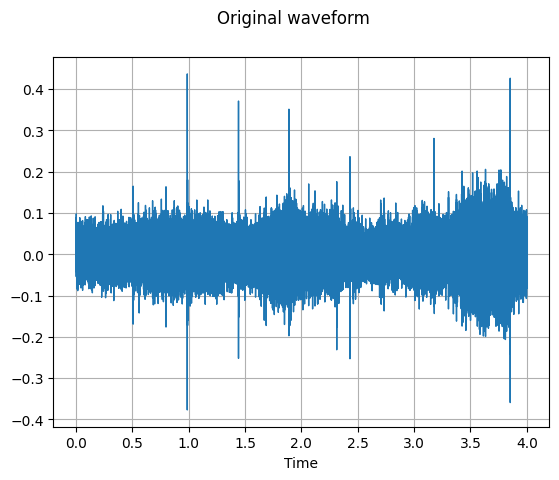

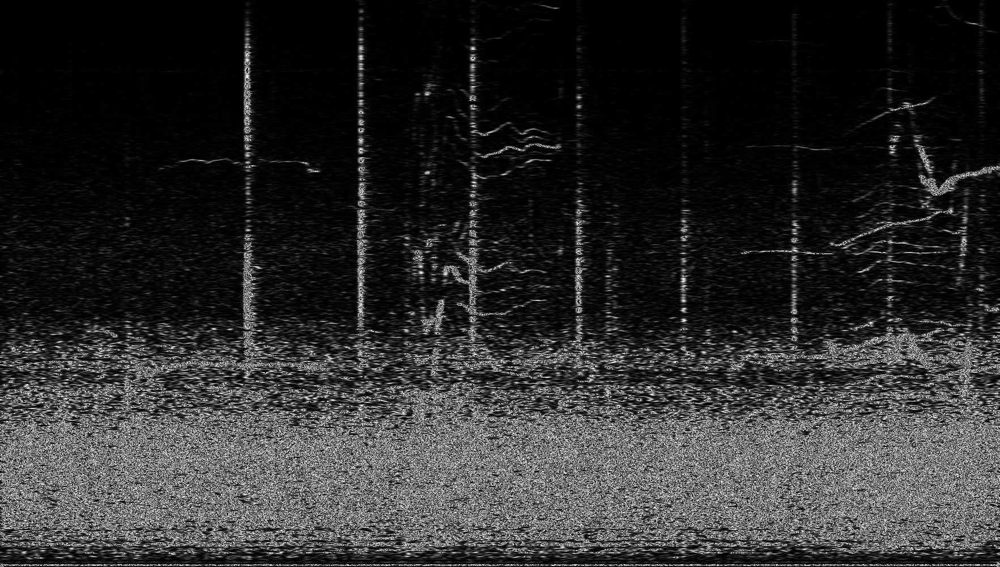

In [ ]:
# https://pytorch.org/audio/main/generated/torchaudio.transforms.AmplitudeToDB.html
# For each available wave file
for ii in range(12, 13):
    
    # Set the path to the audio folder 
    path = r'/content/drive/MyDrive/Masters/PHYS555/DL/audio'
    
    # Get the file name and path
    file = '/' + str(ii) + '.wav'

    fullfile = path + file

    # Set the sample to this file
    SAMPLE_WAV = fullfile

    # Load the wave with torchaudio a
    ORCA_WAVEFORM, SAMPLE_RATE = torchaudio.load(SAMPLE_WAV, normalize=True)

    # Convert from amplitude to db scale spectrograms 
    transform = T.AmplitudeToDB(stype="amplitude", top_db=100)
    orca_waveform_db = transform(ORCA_WAVEFORM)

    # Plot the original waveform 
    plot_waveform(idx=str(ii), waveform=ORCA_WAVEFORM, sr=SAMPLE_RATE, title="Original waveform")
    #plot_waveform(idx=str(ii), waveform=orca_waveform_db, sr=SAMPLE_RATE, title="Original waveform")


    Audio(ORCA_WAVEFORM.numpy(), rate=SAMPLE_RATE)
    #Audio(orca_waveform_db.numpy(), rate=SAMPLE_RATE)

    # Set the spectrogram parameters 
    n_fft = 2000
    win_length = 2000
    hop_length = 100

    # Define spectrogram settings using torch audio transforms  
    spectrogram = T.Spectrogram(n_fft=n_fft, win_length=win_length, hop_length=hop_length, center=True, pad_mode="reflect", power=2.0)
    
    # Calculate the spectrogram 
    spec = spectrogram(ORCA_WAVEFORM)
    #spec = spectrogram(orca_waveform_db)
    
    # Plot and save the spectrogram
    create_spectrogram(idx=str(ii), specgram=spec[0])

# Load in the data

In [ ]:
class OrcaImageDataset(Dataset):
    
    def __init__(self, annotations_file, img_dir, transform, target_transform=None):
        self.img_labels = pd.read_csv(annotations_file)
        self.img_dir = img_dir
        self.transform = transform
        self.target_transform = target_transform

    def __len__(self):
        return len(self.img_labels)

    def __getitem__(self, idx):
        img_path = os.path.join(self.img_dir, self.img_labels.iloc[idx, 0])
        image = read_image(img_path)
        image = image.squeeze()
        label = self.img_labels.iloc[idx, 1]
        if self.transform:
            image = self.transform(image)
        if self.target_transform:
            label = self.target_transform(label)
        return image, label

## dB Scale Dataset

In [ ]:
annotations_file = r"/content/drive/MyDrive/Masters/PHYS555/DL/annotations-edited.csv"
img_dir = r"/content/drive/My Drive/Masters/PHYS555/DL/specs/"
transforms_eff = preprocess()
orca_dataset_db = OrcaImageDataset(annotations_file, img_dir, transform=transforms_eff)
labels_db = orca_dataset_db.img_labels

In [ ]:
xtrain_data_db, test_data_db, ytrain_labels_db, test_labels_db = train_test_split(orca_dataset_db, labels_db, test_size=0.2, random_state=21)

#  split a validation set from the training set
train_data_db, val_data_db, train_labels_db, val_labels_db = train_test_split(
    xtrain_data_db, ytrain_labels_db, test_size=0.2, random_state=22)

In [ ]:
print('The number of samples for training is ' + str(len(train_data_db)))
print('The number of samples for validation is ' + str(len(val_data_db)))
print('The number of samples for testing is ' + str(len(test_data_db)))

The number of samples for training is 380
The number of samples for validation is 95
The number of samples for testing is 119


In [ ]:
batch_size = 1
train_loader_db = DataLoader(train_data_db, batch_size=batch_size, shuffle=True)
val_loader_db = DataLoader(val_data_db, batch_size=batch_size, shuffle=True)
test_loader_db = DataLoader(test_data_db, batch_size=batch_size, shuffle=True)

In [ ]:
img_dir_a = r"/content/drive/My Drive/Masters/PHYS555/DL/magspecs/"
transforms_eff = preprocess()
orca_dataset_a = OrcaImageDataset(annotations_file, img_dir_a, transform=transforms_eff)
labels_a = orca_dataset_a.img_labels

In [ ]:
xtrain_data_a, test_data_a, ytrain_labels_a, test_labels_a = train_test_split(orca_dataset_a, labels_a, test_size=0.2, random_state=21)

#  split a validation set from the training set
train_data_a, val_data_a, train_labels_a, val_labels_a = train_test_split(
    xtrain_data_a, ytrain_labels_a, test_size=0.2, random_state=22)

In [ ]:
print('The number of samples for training is ' + str(len(train_data_a)))
print('The number of samples for validation is ' + str(len(val_data_a)))
print('The number of samples for testing is ' + str(len(test_data_a)))

The number of samples for training is 380
The number of samples for validation is 95
The number of samples for testing is 119


In [ ]:
batch_size = 1
train_loader_a = DataLoader(train_data_a, batch_size=batch_size, shuffle=True)
val_loader_a = DataLoader(val_data_a, batch_size=batch_size, shuffle=True)
test_loader_a = DataLoader(test_data_a, batch_size=batch_size, shuffle=True)

# Data Visualization

## dB scale 

In [ ]:
print(orca_dataset_db.img_labels)

              fn2    label
0      spec-0.png     call
1      spec-1.png     call
2      spec-2.png     call
3      spec-3.png     call
4      spec-4.png     call
..            ...      ...
589  spec-589.png  no_call
590  spec-590.png  no_call
591  spec-591.png  no_call
592  spec-592.png  no_call
593  spec-593.png  no_call

[594 rows x 2 columns]


In [ ]:
print('The shape of tensor for 60th image in train dataset: ', orca_dataset_db[60][0].shape)
print(orca_dataset_db)

The shape of tensor for 60th image in train dataset:  torch.Size([1, 224, 224])


In [ ]:
print(orca_dataset_db[60][0])

tensor([[[0.4824, 0.4235, 0.4392,  ..., 0.4706, 0.5804, 0.5059],
         [0.5804, 0.5020, 0.4706,  ..., 0.5373, 0.5020, 0.4000],
         [0.5725, 0.5333, 0.3882,  ..., 0.4980, 0.5020, 0.4784],
         ...,
         [0.4392, 0.4745, 0.5294,  ..., 0.3961, 0.4431, 0.5647],
         [0.5137, 0.3804, 0.3725,  ..., 0.4471, 0.4667, 0.4706],
         [0.4863, 0.4980, 0.4392,  ..., 0.3608, 0.2314, 0.3216]]])


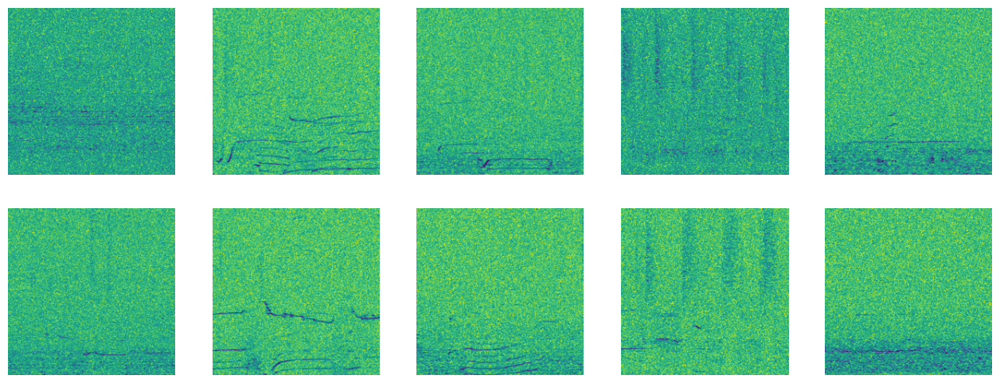

In [ ]:
transform = transforms.ToPILImage()
plt.figure(figsize=(16, 6))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    image, _ = train_loader_db.dataset.__getitem__(i)
    #print(image.shape)
    image = transform(image)
    plt.imshow(image)
    plt.axis('off');
    #print(image.size)

## Amplitude Scale

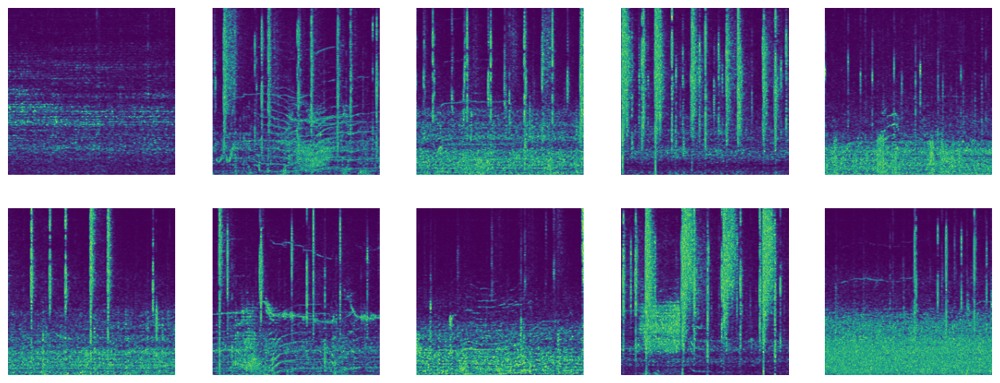

In [ ]:
transform = transforms.ToPILImage()
plt.figure(figsize=(16, 6))
for i in range(10):
    plt.subplot(2, 5, i + 1)
    image, _ = train_loader_a.dataset.__getitem__(i)
    #print(image.shape)
    image = transform(image)
    plt.imshow(image)
    plt.axis('off');
    #print(image.size)

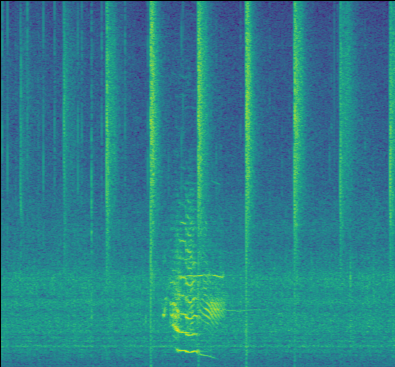

In [ ]:
# Crop the spectrograms and save as images 
path = r"/content/drive/MyDrive/Masters/PHYS555/DL/example_crop"
dirs = os.listdir(path)
crop(path, dirs)

# the initial size of the image 

# Models

In [ ]:
# Train/test loop 
def train_test_model(model, train_loader, val_loader, n_epochs, optimizer):
    criterion = nn.MSELoss()
    optimizer = optimizer
    model = model.train()
    train_losses = []
    val_losses = []
    
    for epoch in range(n_epochs):
        train_batch_losses = []
        val_batch_losses = []
        for data in train_loader:
            img, _ = data
            #img = img.squeeze()
            #print(img.shape)
            img = img.to(device)
            #img = img.reshape(-1, 28*28)
            
            #print(img.shape)
            output = model(img)
            loss = criterion(output, img.data)
            #************************ backward *************************
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            train_batch_losses.append(loss.item()) 
            
        model = model.eval()
        for data in val_loader:
            output = model(img)
            loss = criterion(output, img.data)
            val_batch_losses.append(loss.item())
            
        train_loss = np.mean(train_batch_losses)
        val_loss = np.mean(val_batch_losses)
        
        train_losses.append(train_loss)
        val_losses.append(val_loss)
            
        # ***************************** log ***************************
        if epoch % 10 == 0:
            print(f"epoch [{epoch + 1}/{n_epochs}], Train loss:{train_loss: .4f} Valid:{val_loss: .4f}")
            
    ax = plt.figure().gca()
    ax.plot(train_losses)
    ax.plot(val_losses)
    plt.ylabel('Loss')
    plt.xlabel('Epoch')
    plt.legend(['train', 'val'])
    plt.title('Loss monitoring')
    plt.show()
    
    return model.eval()

In [ ]:
# Linear Autoencoder 
class LinearAutoencoder(torch.nn.Module):
    def __init__(self):
        super().__init__()        
        self.encoder = torch.nn.Sequential(
            #torch.nn.Linear(28 * 28, 256),
            torch.nn.Linear(224, 224),
            torch.nn.ReLU(),
            torch.nn.Linear(224, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, 64),
            torch.nn.ReLU(),
            torch.nn.Linear(64, 10)
        )
          
        self.decoder = torch.nn.Sequential(
            torch.nn.Linear(10, 64),
            torch.nn.ReLU(),
            torch.nn.Linear(64, 128),
            torch.nn.ReLU(),
            torch.nn.Linear(128, 224),
            torch.nn.ReLU(),
            torch.nn.Linear(224, 224),
            torch.nn.Sigmoid()
        )
  
    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

In [ ]:
# Convolutional autoencoder 
class ConvAutoencoder(nn.Module):
    def __init__(self):
        super().__init__()
        ## encoder layers ##
        
        self.encoder = nn.Sequential( 
            nn.Conv2d(1,16,3, padding=1),
            nn.ReLU(),
            nn.MaxPool2d(2,2),
            
            nn.Conv2d(16,4,3, padding=1),
            nn.ReLU(), 
            nn.MaxPool2d(2,2)
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(4,16,2, stride=2), 
            nn.ReLU(), 
            nn.ConvTranspose2d(16,1,2, stride=2),
            nn.Sigmoid()
        )

    def forward(self, x):
        encoded = self.encoder(x)
        decoded = self.decoder(encoded)
        return decoded

# Training

## dB Scale

LinearAutoencoder(
  (encoder): Sequential(
    (0): Linear(in_features=224, out_features=224, bias=True)
    (1): ReLU()
    (2): Linear(in_features=224, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=64, bias=True)
    (5): ReLU()
    (6): Linear(in_features=64, out_features=10, bias=True)
  )
  (decoder): Sequential(
    (0): Linear(in_features=10, out_features=64, bias=True)
    (1): ReLU()
    (2): Linear(in_features=64, out_features=128, bias=True)
    (3): ReLU()
    (4): Linear(in_features=128, out_features=224, bias=True)
    (5): ReLU()
    (6): Linear(in_features=224, out_features=224, bias=True)
    (7): Sigmoid()
  )
)
epoch [1/100], Train loss: 0.0048 Valid: 0.0037
epoch [11/100], Train loss: 0.0039 Valid: 0.0029
epoch [21/100], Train loss: 0.0032 Valid: 0.0033
epoch [31/100], Train loss: 0.0032 Valid: 0.0030
epoch [41/100], Train loss: 0.0032 Valid: 0.0036
epoch [51/100], Train loss: 0.0032 Valid: 0.0032
epoch [61/100], Train l

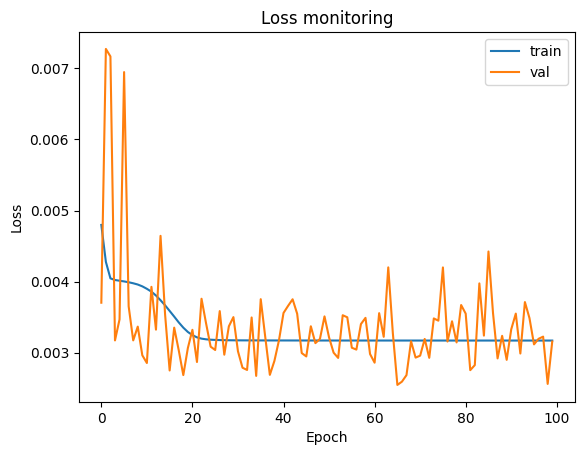

In [ ]:
# Instantiating the model and hyperparameters
model = LinearAutoencoder().to(device)
print(model)
n_epochs = 100
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
linear_model_db = train_test_model(model, train_loader_db, val_loader_db, n_epochs, optimizer)

ConvAutoencoder(
  (encoder): Sequential(
    (0): Conv2d(1, 16, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU()
    (2): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(16, 4, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU()
    (5): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (decoder): Sequential(
    (0): ConvTranspose2d(4, 16, kernel_size=(2, 2), stride=(2, 2))
    (1): ReLU()
    (2): ConvTranspose2d(16, 1, kernel_size=(2, 2), stride=(2, 2))
    (3): Sigmoid()
  )
)
epoch [1/100], Train loss: 0.0115 Valid: 0.0108
epoch [11/100], Train loss: 0.0054 Valid: 0.0090
epoch [21/100], Train loss: 0.0045 Valid: 0.0032
epoch [31/100], Train loss: 0.0041 Valid: 0.0046
epoch [41/100], Train loss: 0.0039 Valid: 0.0061
epoch [51/100], Train loss: 0.0037 Valid: 0.0028
epoch [61/100], Train loss: 0.0035 Valid: 0.0037
epoch [71/100], Train loss: 0.0033 Valid: 0.0035
epoch [81/100],

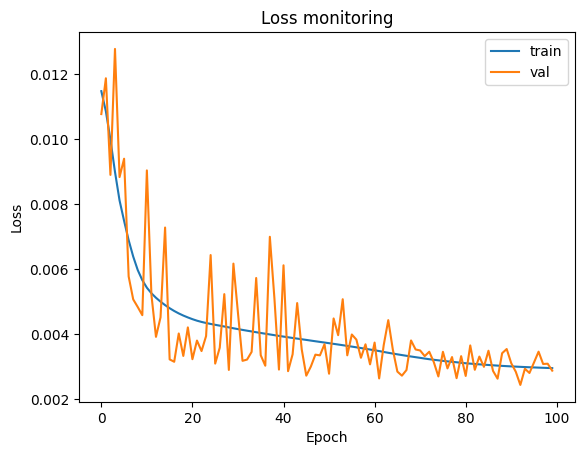

In [ ]:
# initialize the NN
model = ConvAutoencoder().to(device)
print(model)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
n_epochs=100
cnn_model_db = train_test_model(model, train_loader_db, val_loader_db, n_epochs, optimizer)

## Amplitude Scale

epoch [1/100], Train loss: 0.1559 Valid: 0.1423
epoch [11/100], Train loss: 0.0405 Valid: 0.0407
epoch [21/100], Train loss: 0.0404 Valid: 0.0319
epoch [31/100], Train loss: 0.0105 Valid: 0.0044
epoch [41/100], Train loss: 0.0102 Valid: 0.0265
epoch [51/100], Train loss: 0.0102 Valid: 0.0164
epoch [61/100], Train loss: 0.0102 Valid: 0.0093
epoch [71/100], Train loss: 0.0102 Valid: 0.0132
epoch [81/100], Train loss: 0.0102 Valid: 0.0136
epoch [91/100], Train loss: 0.0102 Valid: 0.0037


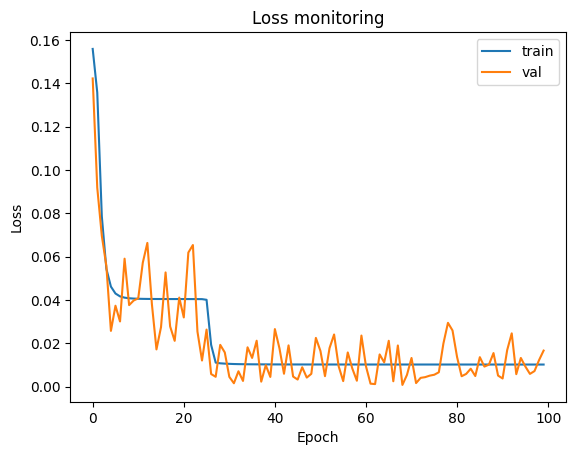

In [ ]:
# Instantiating the model and hyperparameters
model = LinearAutoencoder().to(device)
n_epochs = 100
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
linear_model_a = train_test_model(model, train_loader_a, val_loader_a, n_epochs, optimizer)

epoch [1/100], Train loss: 0.1087 Valid: 0.0944
epoch [11/100], Train loss: 0.0670 Valid: 0.0441
epoch [21/100], Train loss: 0.0354 Valid: 0.0505
epoch [31/100], Train loss: 0.0237 Valid: 0.0191
epoch [41/100], Train loss: 0.0126 Valid: 0.0134
epoch [51/100], Train loss: 0.0072 Valid: 0.0050
epoch [61/100], Train loss: 0.0064 Valid: 0.0075
epoch [71/100], Train loss: 0.0060 Valid: 0.0067
epoch [81/100], Train loss: 0.0057 Valid: 0.0052
epoch [91/100], Train loss: 0.0055 Valid: 0.0066


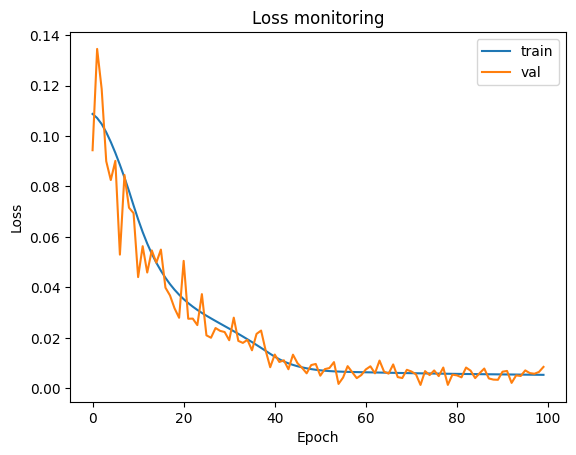

In [ ]:
# initialize the NN
model = ConvAutoencoder().to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=1e-5)
n_epochs=100
cnn_model_a = train_test_model(model, train_loader_a, val_loader_a, n_epochs, optimizer)

# Exploring Output

## dB Scale

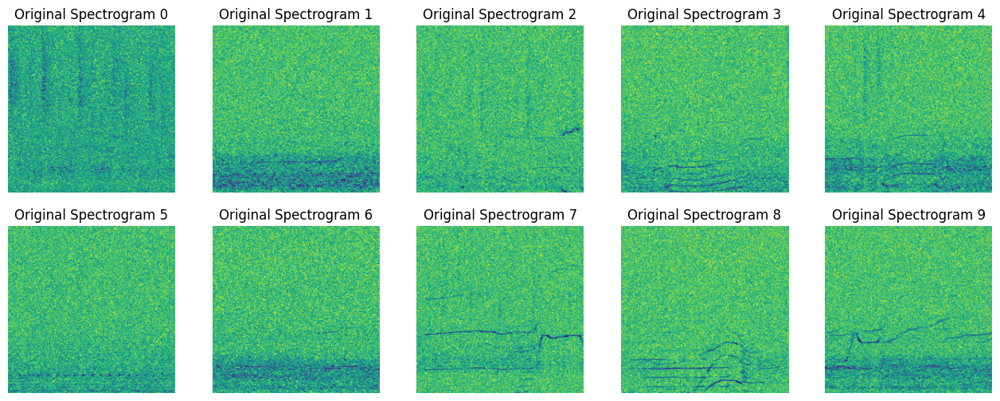

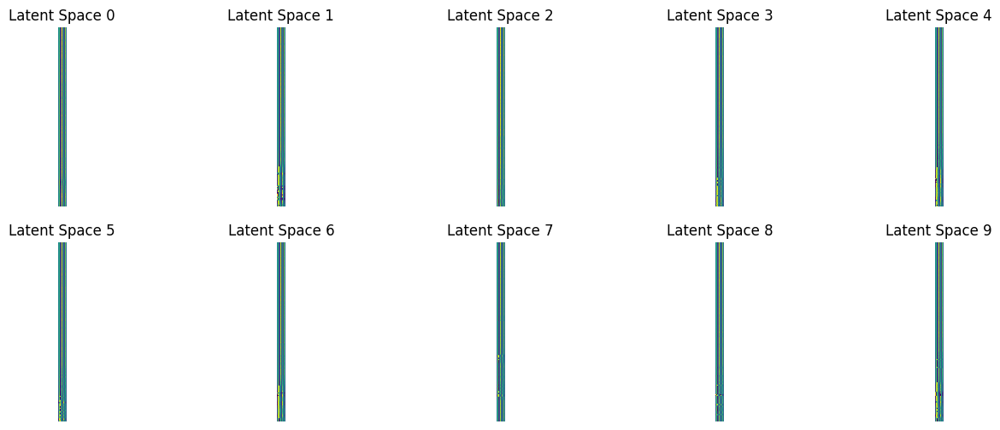

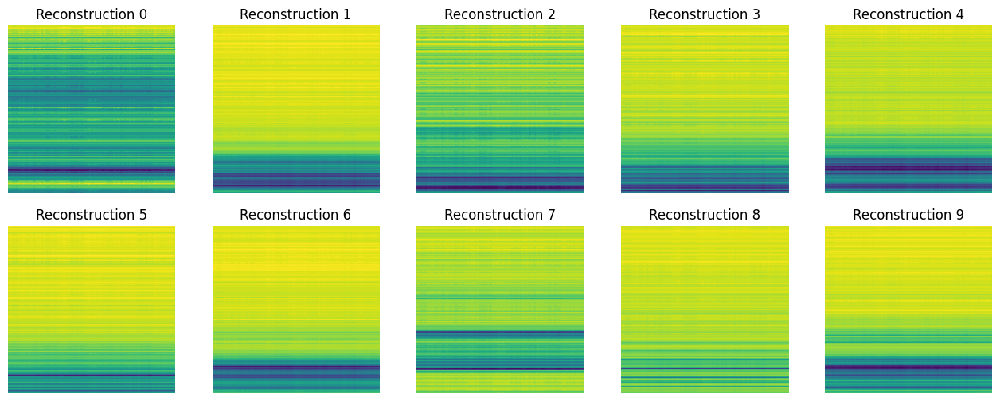

In [ ]:
transform = transforms.ToPILImage()
fig1 = plt.figure(figsize=(16, 6))
fig2 = plt.figure(figsize=(16, 6))
fig3 = plt.figure(figsize=(16, 6))
for idex, data in enumerate(train_loader_db):
    if idex<10:
        
        img, _ = data
        img = img.to(device)
        
        imgs = img.squeeze()
        imgs = transform(imgs)
        
        lspace = linear_model_db.encoder(img)
        lspaces = lspace.squeeze()
        image_l = transform(lspaces)
        
        output = linear_model_db(img)
        output_sq = output.squeeze()
        image_o = transform(output_sq)
        
        plt.figure(1)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(imgs)
        plt.title('Original Spectrogram ' + str(idex))
        plt.axis('off');
        
        plt.figure(2)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(image_l)
        plt.title('Latent Space ' + str(idex))
        plt.axis('off');
        
        plt.figure(3)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(image_o)
        plt.title('Reconstruction ' + str(idex))
        plt.axis('off');

In [ ]:
lspacess = []
labels = []
transform = transforms.ToPILImage()
fig1 = plt.figure(figsize=(16, 6))
fig2 = plt.figure(figsize=(16, 6))
fig3 = plt.figure(figsize=(16, 6))
for idex, data in enumerate(train_loader_db):
    
    # plotting
    if idex<10:
        
        img, _ = data
        img = img.to(device)

        imgs = img.squeeze()
        imgs = transform(imgs)

        lspace = cnn_model_db.encoder(img)
        lspaces = lspace.squeeze()
        image_l = transform(lspaces)

        output = cnn_model_db(img)
        output_sq = output.squeeze()
        image_o = transform(output_sq)

        plt.figure(1)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(imgs)
        plt.title('Original Spectrogram ' + str(idex))
        plt.axis('off');

        plt.figure(2)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(image_l)
        plt.title('Latent Space ' + str(idex))
        plt.axis('off');

        plt.figure(3)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(image_o)
        plt.title('Reconstruction ' + str(idex))
        plt.axis('off');

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#conv_model2 = CNN_autoencoder2().to(device)
#num_epochs = 100
#optimizer = torch.optim.Adam(conv_model2.parameters(), lr=1e-3)
lspaces = []
labels = []
for data in train_loader_db:
    img, _ = data
    img = img.to(device)
    lspace = cnn_model_db.encoder(img)
    output = cnn_model_db(img)
    #print(lspace.shape)
    lspacef = torch.flatten(lspace, start_dim=1, end_dim=-1)
    #print(lspacef.shape)
    lspacen = lspacef.to('cpu')
    lspacen = lspacen.detach().numpy()
    lspaces.append(lspacen)
    if data[1][0]=='call':
        labels.append(1)
    else:
        labels.append(0)

In [ ]:
edited = []
for ii in range(0, len(lspaces)):
    edited.append(lspaces[ii][0])

In [ ]:
df = pd.DataFrame(edited)

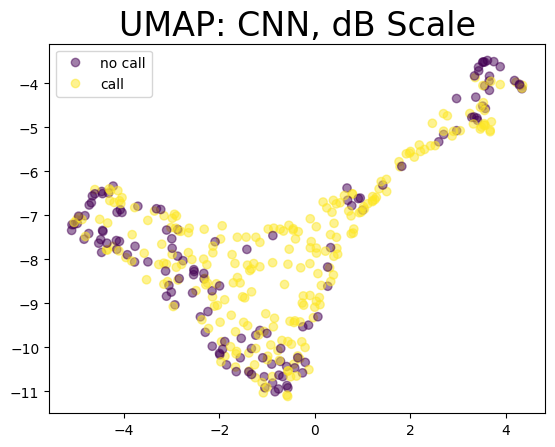

In [ ]:
reducer = umap.UMAP()
sp_names = ['no call', 'call']
embedding = reducer.fit_transform(df)
scatter = plt.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=labels, alpha=0.5)
plt.legend(handles = scatter.legend_elements()[0], labels=sp_names)
plt.title('UMAP: CNN, dB Scale', fontsize=24);

#plt.legend(handles=scatter.legend_elements()[0], 
#           labels=sp_names,
#           title="species")

In [ ]:
hover_data = pd.DataFrame({'index':np.arange(380),
                           'label':labels})
hover_data['item'] = hover_data.label.map(
    {
        0:'no call',
        1:'call'
    }
)

In [ ]:
#https://umap-learn.readthedocs.io/en/0.4dev/plotting.html
umap.plot.output_notebook()
mapper = umap.UMAP().fit(df)

In [ ]:
p = umap.plot.interactive(mapper, labels=labels, hover_data=hover_data, point_size=8, theme='blue')
umap.plot.show(p)

Text(0.5, 1.0, 'KMean Cluster Colouring on UMAP Projection')

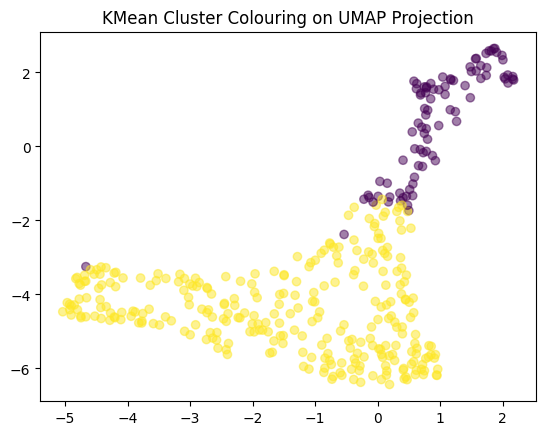

In [ ]:
kmeans = KMeans(n_clusters=2, init="random", n_init=10, max_iter=300, random_state=42)
label_kmean = kmeans.fit_predict(df)

df['kmeanc'] = label_kmean

plt.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=label_kmean, alpha=0.5)
plt.title('KMean Cluster Colouring on UMAP Projection')


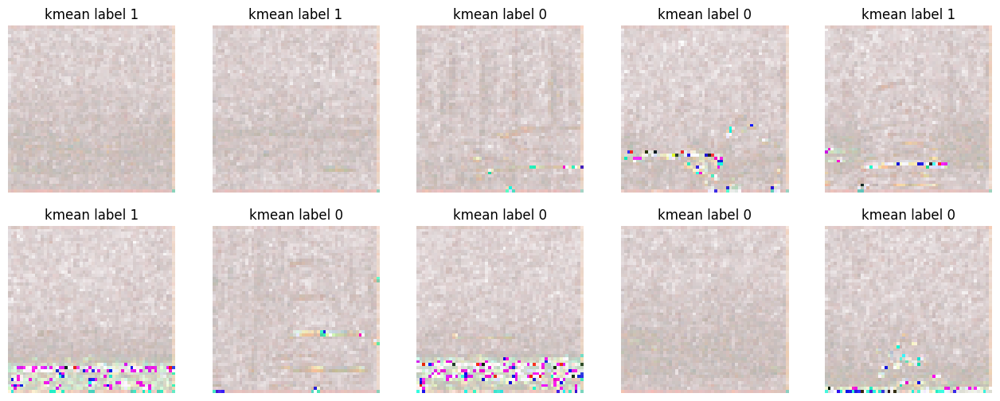

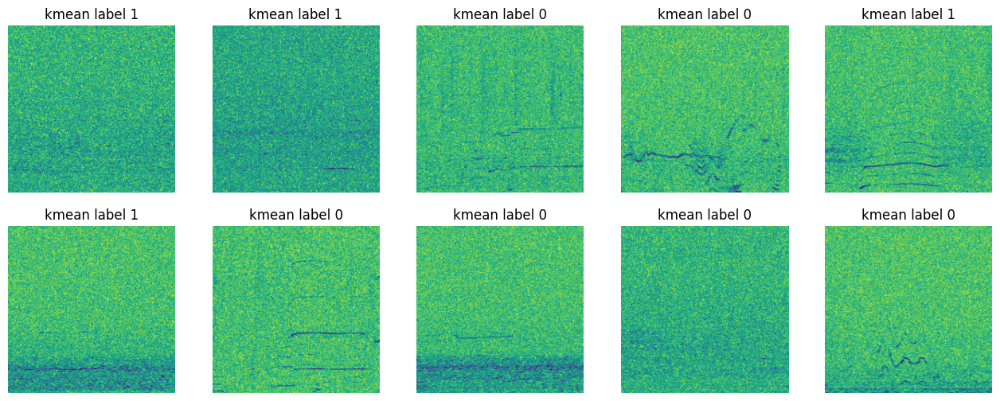

In [ ]:
transform = transforms.ToPILImage()
fig1 = plt.figure(figsize=(16, 6))
fig2 = plt.figure(figsize=(16, 6))
for idex, data in enumerate(train_loader_db):
    if idex<10:
        
        img, _ = data
        img = img.to(device)
        
        imgs = img.squeeze()
        imgs = transform(imgs)
        
        lspace = cnn_model_db.encoder(img)
        lspaces = lspace.squeeze()
        image_l = transform(lspaces)
        
        output = cnn_model_db(img)
        output_sq = output.squeeze()
        image_o = transform(output_sq)
        
        plt.figure(1)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(image_l)
        plt.title('kmean label ' + str(label_kmean[idex]))
        plt.axis('off');
        
        plt.figure(2)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(imgs)
        plt.title('kmean label ' + str(label_kmean[idex]))
        plt.axis('off');
        

## Amplitude Scale 

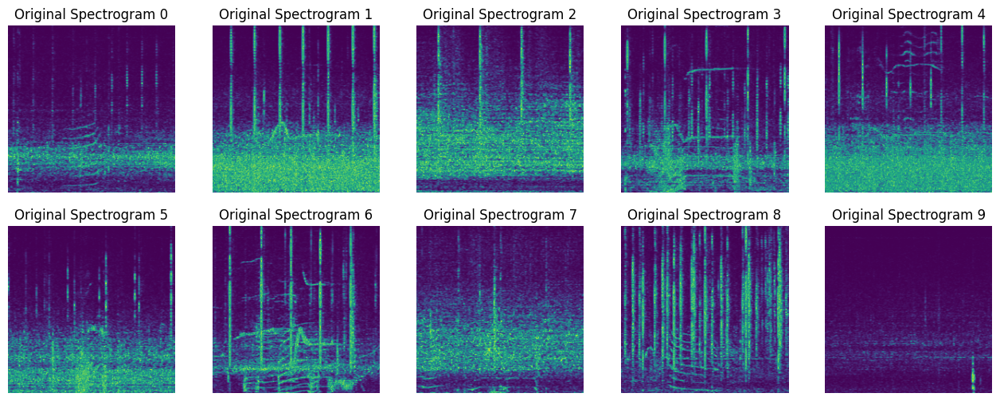

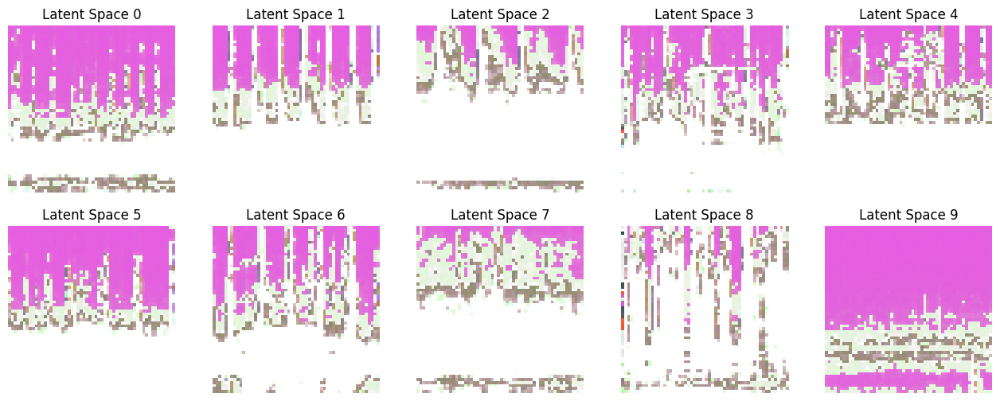

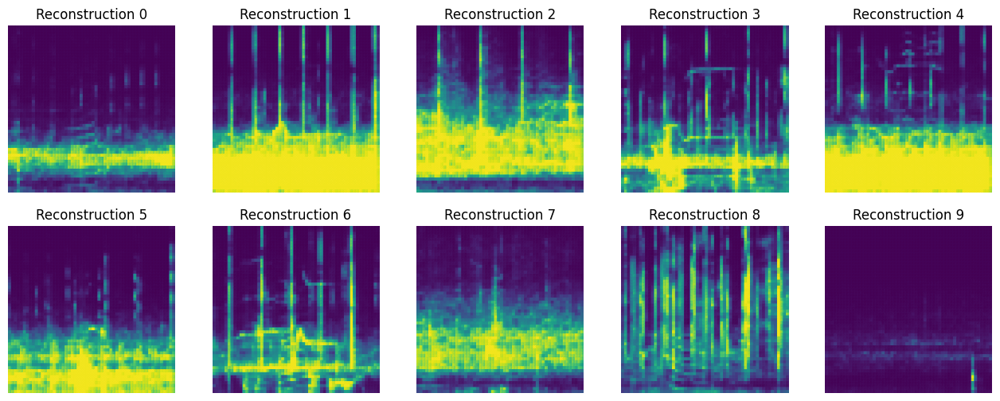

In [ ]:
lspacess = []
labels = []
transform = transforms.ToPILImage()
fig1 = plt.figure(figsize=(16, 6))
fig2 = plt.figure(figsize=(16, 6))
fig3 = plt.figure(figsize=(16, 6))
for idex, data in enumerate(train_loader_a):
    
    # plotting
    if idex<10:
        
        img, _ = data
        img = img.to(device)

        imgs = img.squeeze()
        imgs = transform(imgs)

        lspace = cnn_model_a.encoder(img)
        lspaces = lspace.squeeze()
        image_l = transform(lspaces)

        output = cnn_model_a(img)
        output_sq = output.squeeze()
        image_o = transform(output_sq)

        plt.figure(1)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(imgs)
        plt.title('Original Spectrogram ' + str(idex))
        plt.axis('off');

        plt.figure(2)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(image_l)
        plt.title('Latent Space ' + str(idex))
        plt.axis('off');

        plt.figure(3)
        plt.subplot(2, 5, idex + 1)
        plt.imshow(image_o)
        plt.title('Reconstruction ' + str(idex))
        plt.axis('off');

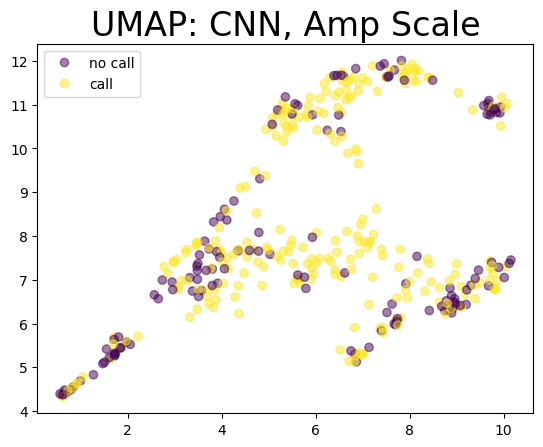

In [ ]:
lspaces = []
labels = []
for data in train_loader_a:
    img, _ = data
    img = img.to(device)
    lspace = cnn_model_a.encoder(img)
    output = cnn_model_a(img)
    #print(lspace.shape)
    lspacef = torch.flatten(lspace, start_dim=1, end_dim=-1)
    #print(lspacef.shape)
    lspacen = lspacef.to('cpu')
    lspacen = lspacen.detach().numpy()
    lspaces.append(lspacen)
    if data[1][0]=='call':
        labels.append(1)
    else:
        labels.append(0)

edited = []
for ii in range(0, len(lspaces)):
    edited.append(lspaces[ii][0])

df = pd.DataFrame(edited)

reducer = umap.UMAP()
sp_names = ['no call', 'call']
embedding = reducer.fit_transform(df)
scatter = plt.scatter(
    embedding[:, 0],
    embedding[:, 1],
    c=labels, alpha=0.5)
plt.legend(handles = scatter.legend_elements()[0], labels=sp_names)
plt.title('UMAP: CNN, Amp Scale', fontsize=24);


hover_data = pd.DataFrame({'index':np.arange(380),
                           'label':labels})
hover_data['item'] = hover_data.label.map(
    {
        0:'no call',
        1:'call'
    }
)

#https://umap-learn.readthedocs.io/en/0.4dev/plotting.html
umap.plot.output_notebook()
mapper = umap.UMAP().fit(df)

p = umap.plot.interactive(mapper, labels=labels, hover_data=hover_data, point_size=8, theme='blue')
umap.plot.show(p)